## ArcticDEM vs ICESat-2
#### Compute relative height changes between ICESat-2 points and Arctic DEM over Alaska

In [22]:
import os
os.environ['USE_PYGEOS'] = '0'
import geopandas as gpd
import boto3
from sliderule import sliderule, icesat2, earthdata
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.dates as mdates

In [2]:
#https://xyzservices.readthedocs.io/en/stable/introduction.html
import xyzservices

In [37]:
aoi_url = 'https://raw.githubusercontent.com/ICESAT-2HackWeek/dzdt/main/sites/Anaktuvuk_north_slope_smaller.geojson'
gfa = gpd.read_file(aoi_url)
terrain_map = xyzservices.providers.Esri.WorldImagery()
gfa.explore(style_kwds=dict(fill=False, color='magenta'),tiles=terrain_map)

In [4]:
icesat2.init("slideruleearth.io", verbose=True)

In [5]:
# Start with all defaults, just Polygon
parms = {
    "poly": sliderule.toregion(gfa)["poly"],
    # "srt": icesat2.SRT_LAND,
    # "cnf": icesat2.CNF_SURFACE_HIGH,
    # "len": 40.0,
    # "res": 20.0,
    # "maxi": 6
    #"t0": "2023-01-01T00:00:00Z",
    #"t1": "2024-01-01T00:00:00Z",
}

In [6]:
# Add Raster Sampling
# https://www.slideruleearth.io/web/rtd/user_guide/GeoRaster.html
#geojson = earthdata.tnm(short_name='Digital Elevation Model (DEM) 1 meter', polygon=sliderule.toregion(gfa)['poly']) 
parms["samples"] = {
            # "hls": {"asset": "landsat-hls", "bands": ["NDSI"]},
            #"dem_stats": {"asset": "usgs3dep-1meter-dem", "radius":10.0, "zonal_stats":True, "catlog":geojson},
            "mosaic": {"asset": "arcticdem-mosaic", "algorithm":"NearestNeighbour"},
            #"mosaic": {"asset": "arcticdem-mosaic", "radius": 10.0, "zonal_stats": True},
            #"strips": {"asset": "arcticdem-strips", "algorithm": "CubicSpline"}
        }

In [7]:
%%time

# Run SlideRule

gf = icesat2.atl06p(parms, version='006')

print("Start:", gf.index.min().strftime('%Y-%m-%d'))
print("End:", gf.index.max().strftime('%Y-%m-%d'))
print("Reference Ground Tracks: {}".format(gf["rgt"].unique()))
print("Cycles: {}".format(gf["cycle"].unique()))
print("Elevation Measurements: {} ".format(gf.shape[0]))
gf.head(2)

INFO:sliderule.earthdata:Identified 147 resources to process
INFO:sliderule.sliderule:request <AppServer.4672> processing initialized on ATL03_20181020133851_03350105_006_02.h5 ...
INFO:sliderule.sliderule:request <AppServer.4647> processing initialized on ATL03_20181024133033_03960105_006_02.h5 ...
INFO:sliderule.sliderule:request <AppServer.4625> processing initialized on ATL03_20181028003721_04490103_006_02.h5 ...
INFO:sliderule.sliderule:request <AppServer.4593> processing initialized on ATL03_20181129230459_09520103_006_02.h5 ...
INFO:sliderule.sliderule:request <AppServer.4544> processing initialized on ATL03_20190119091838_03350205_006_02.h5 ...
INFO:sliderule.sliderule:request <AppServer.4515> processing initialized on ATL03_20190322062235_12800205_006_02.h5 ...
INFO:sliderule.sliderule:request <AppServer.4623> processing initialized on ATL03_20181122120639_08380105_006_02.h5 ...
INFO:sliderule.sliderule:request <AppServer.4822> processing initialized on ATL03_20190123091026_03

Start: 2018-10-20
End: 2023-04-16
Reference Ground Tracks: [ 335  396  449  838  952 1280    7  510]
Cycles: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]
Elevation Measurements: 666095 
CPU times: user 36.6 s, sys: 1.18 s, total: 37.7 s
Wall time: 4min 1s


,segment_id,n_fit_photons,rgt,h_mean,gt,distance,rms_misfit,cycle,w_surface_window_final,h_sigma,dh_fit_dx,dh_fit_dy,pflags,spot,geometry,mosaic.value,mosaic.file_id,mosaic.flags,mosaic.time
time,,,,,,,,,,,,,,,,,,,
2018-10-20 13:41:52.945532416,619895,23,335,819.070366,50,1.241679e+07,0.0,1,30.000000,0.0,0.593204,0.0,2,2,POINT (-151.25094 68.63673),483.755432,0.0,0.0,1.358109e+12
2018-10-20 13:41:52.948339200,619896,25,335,845.010575,50,1.241681e+07,0.0,1,61.208381,0.0,2.400209,0.0,2,2,POINT (-151.25099 68.63655),484.894684,0.0,0.0,1.358109e+12


In [9]:
gf.to_file('Anaktuvuk_total_hits_small_area.gpkg',driver='GPKG')

In [10]:
gf['dh'] = gf['h_mean'] - gf['mosaic.value']

In [13]:
#gf = gf.sort_values(by='index',ascending=True)
gf['dates'] = [str(x).split('T')[0] for x in gf.index.values]

In [16]:
median_height_change = gf.groupby(["dates"])["dh"].median()

In [ ]:
median_height_change = gf.groupby(["dates"])["dh"].median()

In [25]:
gf.shape

(666095, 21)

### Analysis using 600 thousands points, can be done in minutes! 

In [26]:
#from datetime explore issue on folium
import folium
import pandas as pd
def explore(gdf: gpd.GeoDataFrame, *args, column=None, **kwargs) -> folium.Map:
    """Version of `GeoDataFrame.explore()` method that handles columns of 
    DateTime64 somewhat reasonably. All arguments are passed on to `.explore()` after
    handling DateTime64 columns in `gdf` or `column`.
    
    Can be used in a pipe like so: 
        gdf.pipe(explore, m=m, column="datetime64_col", name="time")"""

    dt_columns = gdf.select_dtypes(["datetime64", "timedelta64"]).columns

    if isinstance(column, str):
        column = gdf[column]
    if pd.api.types.is_datetime64_any_dtype(column):
        column = column.astype("int64")
        # this keeps the branca from encountering an overflow in long_scalars
        column = column-column.min() 
        column = column / column.max() 
    
    gdf = gdf[:]
    gdf[dt_columns] = gdf[dt_columns].astype("str")
    return gdf.explore(*args, column=column, **kwargs)

In [38]:
gf.sample(n=10000).reset_index().pipe(explore,column='dh',cmap='RdBu',vmin=-1,vmax=1,tiles=terrain_map)

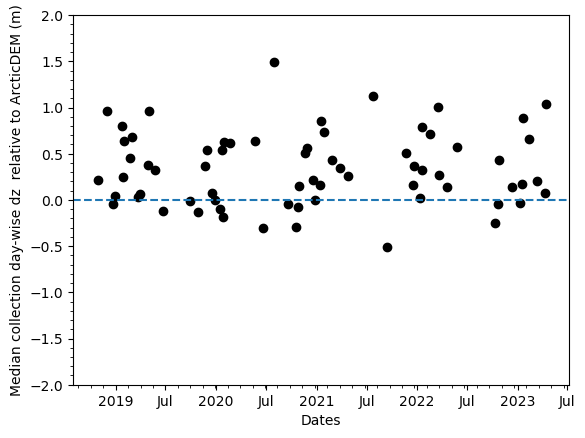

In [43]:
f,ax = plt.subplots()
ax.scatter(pd.DatetimeIndex(median_height_change.index),median_height_change.values,c='k')
ax.set_ylim(-2,2)
ax.set_ylabel('Median collection day-wise dz  relative to ArcticDEM (m)')
ax.set_xlabel('Dates')
ax.axhline(y=0,linestyle='--',linewidth=1.5)
ax.xaxis.set_major_formatter(
mdates.ConciseDateFormatter(ax.xaxis.get_major_locator()))
ax.minorticks_on()

## There is some seasonal signal with increase as winters comes up and decline from the begining of new year, but we need to do more filtering and analysis